初期設定

In [1]:
using DifferentialEquations
#
sides = [:user, :cmpl]
#
TIMESTEP = 0.015625
TIMEMAX = 109
#
ComplementorsSwitchFlag=0
#
AdvertisingEndTimeA = 72
AdvertisingEndTimeB = 87
AdvertisingStartTimeA = 1
AdvertisingStartTimeB = 0
ComplementsAVelocity = Dict(:user => 0.4003, :cmpl => 0.1556)
ComplementsBVelocity = Dict(:user => 0.1381, :cmpl => 0.2204)
DepletionRateA = 0.01
DepletionRateB = 0.01
IndirectNetworkEffectsStrengthA = 0.1394  # 感度分析のためにパラメータ設定する
IndirectNetworkEffectsStrengthB = 0.253   # 感度分析のためにパラメータ設定する
InitialQualityA = 1
InitialQualityB = 1
ReferenceExpectationA = 6033.13
ReferenceExpectationB = 51.9356
ResponseTimeA = Dict(:user => 29.8852, :cmpl => 46.7199)
ResponseTimeB = Dict(:user => 4, :cmpl => 16.6598)
SalesVolumeAperUser = 2
SalesVolumeBperUser = 0.9
SubstituteValueA = Dict(:user => 1, :cmpl => 1e+07)
SubstituteValueB = Dict(:user => 45550.8, :cmpl => 3.0222e+061)
#
TotalPopulation = Dict(:user => 2.30476e+07, :cmpl => 115)
#
AdvertisingEffectivenessA = Dict(:user => 0.0001, :cmpl => 0.0153)
AdvertisingEffectivenessB = Dict(:user => 0.0039, :cmpl => 0.0119)
ContactRateA = Dict(:user => 0.9905, :cmpl => 1e-05)
ContactRateB = Dict(:user => 1e-05, :cmpl => 0.3547)
ExitRateA = Dict(:user => 0.5, :cmpl => 0.006)
ExitRateB = Dict(:user => 0.2481, :cmpl => 0.0)
ReferenceComplementVolumeA = Dict(:user => 6.68753e+07, :cmpl => 464)
ReferenceComplementVolumeB = Dict(:user => 7.40713e+07, :cmpl => 943)

Dict{Symbol, Real} with 2 entries:
  :user => 7.40713e7
  :cmpl => 943

モデルの定義

In [3]:
using DifferentialEquations

function systemdynamics!(dY, Y, p, t)
    
    # zidz function moved inside systemdynamics!

      function zidz(a, b)
          if abs(b) < 1e-6
              return 0.0
          else
              return a / b
          end
      end

 # Assign variables from Y
 AccumulatedAdoptersA = Dict(:user => Y[1], :cmpl => Y[2])
 AccumulatedAdoptersB = Dict(:user => Y[3], :cmpl => Y[4])
 ComplementsASalesVolume = Dict(:user => Y[5], :cmpl => Y[6])
 ComplementsBSalesVolume = Dict(:user => Y[7], :cmpl => Y[8])
 ExpectedQualityA = Y[9]
 ExpectedQualityB = Y[10]
 MultihomingUsers = Dict(:user => Y[11], :cmpl => Y[12])
 PlatformAAdopters = Dict(:user => Y[13], :cmpl => Y[14])
 PlatformBAdopters = Dict(:user => Y[15], :cmpl => Y[16])
 PlatformASalesVolume = Y[17]
 PlatformBSalesVolume = Y[18]
 PotentialAdopters = Dict(:user => Y[19], :cmpl => Y[20])

# Implement the equations
# Initialize dictionaries for variables that vary by side
sides = [:user, :cmpl]
flip(s) = s == :user ? :cmpl : :user

AdvertisingEffectsA = Dict(s => ifelse((t >= AdvertisingStartTimeA) && (t < AdvertisingEndTimeA), AdvertisingEffectivenessA[s]*PotentialAdopters[s], 0) for s in sides)
AdvertisingEffectsB = Dict(s => ifelse((t >= AdvertisingStartTimeB) && (t < AdvertisingEndTimeB), AdvertisingEffectivenessB[s]*PotentialAdopters[s], 0) for s in sides)

PlatformAAdopterFraction = Dict(s => PlatformAAdopters[s] / TotalPopulation[s] for s in sides)
PlatformBAdopterFraction = Dict(s => PlatformBAdopters[s] / TotalPopulation[s] for s in sides)

ComplementsASalesIncrement = Dict(s => PlatformAAdopters[s] * ComplementsAVelocity[s] for s in sides)
ComplementsBSalesIncrement = Dict(s => PlatformBAdopters[s] * ComplementsBVelocity[s] for s in sides)
ComplementValuetoPlatformA = Dict(s => ComplementsASalesVolume[s] / ReferenceComplementVolumeA[s] for s in sides)
ComplementValuetoPlatformB = Dict(s => ComplementsBSalesVolume[s] / ReferenceComplementVolumeB[s] for s in sides)

AdoptersExpectationA = PlatformAAdopters[:user] / ReferenceExpectationA
AdoptersExpectationB = PlatformBAdopters[:user] / ReferenceExpectationB
ExpectedIncrementA = AdoptersExpectationA
ExpectedIncrementB = AdoptersExpectationB
ExpectedQualityDepletionA = if t >= AdvertisingEndTimeA
    ExpectedQualityA * DepletionRateA
else
    0
end 
ExpectedQualityDepletionB = if t >= AdvertisingEndTimeB
    ExpectedQualityB * DepletionRateB
else
    0
end 

ValuetoNonPlatformAAdopters = Dict(s => ExpectedQualityA*ComplementValuetoPlatformA[flip(s)]*(PlatformAAdopterFraction[flip(s)])^IndirectNetworkEffectsStrengthA for s in sides)
ValuetoNonPlatformBAdopters = Dict(s => ExpectedQualityB*ComplementValuetoPlatformB[flip(s)]*(PlatformBAdopterFraction[flip(s)])^IndirectNetworkEffectsStrengthB for s in sides)

AdoptionFractionA = Dict(s => zidz(ValuetoNonPlatformAAdopters[s], ValuetoNonPlatformAAdopters[s] + ValuetoNonPlatformBAdopters[s] + SubstituteValueA[s]) for s in sides)
AdoptionFractionB = Dict(s => zidz(ValuetoNonPlatformBAdopters[s], ValuetoNonPlatformAAdopters[s] + ValuetoNonPlatformBAdopters[s] + SubstituteValueB[s]) for s in sides)

PlatformAValuetoPlatformAAdopters = Dict(s => ValuetoNonPlatformAAdopters[s] for s in sides)
PlatformAValuetoPlatformBAdopters = Dict(s => ValuetoNonPlatformAAdopters[s] for s in sides)
PlatformBValuetoPlatformAAdopters = Dict(s => ValuetoNonPlatformBAdopters[s] for s in sides)
PlatformBValuetoPlatformBAdopters = Dict(s => ValuetoNonPlatformBAdopters[s] for s in sides)

CombinedValuetoPlatformAAdopters = Dict(s => PlatformAValuetoPlatformAAdopters[s] + PlatformBValuetoPlatformAAdopters[s] for s in sides)
CombinedValuetoPlatformBAdopters = Dict(s => PlatformBValuetoPlatformBAdopters[s] + PlatformAValuetoPlatformBAdopters[s] for s in sides)

SwitchFractiontoA = Dict(s => zidz(PlatformAValuetoPlatformBAdopters[s], CombinedValuetoPlatformBAdopters[s] + SubstituteValueB[s]) for s in sides)
SwitchFractiontoB = Dict(s => zidz(PlatformBValuetoPlatformAAdopters[s], CombinedValuetoPlatformAAdopters[s] + SubstituteValueA[s]) for s in sides)
IndicatedSwitcherstoA = Dict(s => SwitchFractiontoA[s] * PlatformBAdopters[s] / ResponseTimeB[s] for s in sides)
IndicatedSwitcherstoB = Dict(s => SwitchFractiontoB[s] * PlatformAAdopters[s] / ResponseTimeA[s] for s in sides)

SwitchersfromAtoB = Dict(s => s==:user ? IndicatedSwitcherstoB[s] : IndicatedSwitcherstoB[s]*ComplementorsSwitchFlag for s in sides)
SwitchersfromBtoA = Dict(s => s==:user ? IndicatedSwitcherstoA[s] : IndicatedSwitcherstoA[s]*ComplementorsSwitchFlag for s in sides)
SwitcherstoA = SwitchersfromBtoA
SwitcherstoB = SwitchersfromAtoB

WordofMouthEffectsA = Dict(s => zidz(ContactRateA[s] * AdoptionFractionA[s] * PlatformAAdopters[s] * PotentialAdopters[s], TotalPopulation[s]) for s in sides)
WordofMouthEffectsB = Dict(s => zidz(ContactRateB[s] * AdoptionFractionB[s] * PlatformBAdopters[s] * PotentialAdopters[s], TotalPopulation[s]) for s in sides)

NewAdoptersA = Dict(s => min(PotentialAdopters[s]/TIMESTEP, AdvertisingEffectsA[s] + WordofMouthEffectsA[s]) for s in sides)
NewAdoptersB = Dict(s => min(PotentialAdopters[s]/TIMESTEP, AdvertisingEffectsB[s] + WordofMouthEffectsB[s]) for s in sides)

AdoptersAIncrement = Dict(s => NewAdoptersA[s] + SwitcherstoA[s] for s in sides)
AdoptersBIncrement = Dict(s => NewAdoptersB[s] + SwitcherstoB[s] for s in sides)

PlatformASalesIncrement = AdoptersAIncrement[:user]*SalesVolumeAperUser
PlatformBSalesIncrement = AdoptersBIncrement[:user]*SalesVolumeBperUser

PlatformAExit = Dict(s => ifelse(t >= AdvertisingEndTimeA, PlatformAAdopters[s]*ExitRateA[s], 0) for s in sides)
PlatformBExit = Dict(s => ifelse(t >= AdvertisingEndTimeB, PlatformBAdopters[s]*ExitRateB[s], 0) for s in sides)

MultihomingIncrement = Dict(s => SwitcherstoA[s] + SwitcherstoB[s] for s in sides)
MultihomingRatio = Dict(s => zidz(MultihomingUsers[s], (AccumulatedAdoptersA[s] + AccumulatedAdoptersB[s])) for s in sides)

TotalDiffusionRate = Dict(s => (PlatformAAdopters[s] + PlatformBAdopters[s]) / TotalPopulation[s] for s in sides)

#
# Update dY
#
dY[1] =  AdoptersAIncrement[:user]
dY[2] =  AdoptersAIncrement[:cmpl]
dY[3] =  AdoptersBIncrement[:user]
dY[4] =  AdoptersBIncrement[:cmpl]
dY[5] =  ComplementsASalesIncrement[:user]
dY[6] =  ComplementsASalesIncrement[:cmpl]
dY[7] =  ComplementsBSalesIncrement[:user]
dY[8] =  ComplementsBSalesIncrement[:cmpl]
dY[9] =  ExpectedIncrementA-ExpectedQualityDepletionA
dY[10] =  ExpectedIncrementB-ExpectedQualityDepletionB
dY[11] =  MultihomingIncrement[:user]
dY[12] =  MultihomingIncrement[:cmpl]
dY[13] = NewAdoptersA[:user]+SwitcherstoA[:user]-SwitcherstoB[:user]-PlatformAExit[:user]
dY[14] = NewAdoptersA[:cmpl]+SwitcherstoA[:cmpl]-SwitcherstoB[:cmpl]-PlatformAExit[:cmpl]
dY[15] = SwitcherstoB[:user]+NewAdoptersB[:user]-SwitcherstoA[:user]-PlatformBExit[:user]
dY[16] = SwitcherstoB[:cmpl]+NewAdoptersB[:cmpl]-SwitcherstoA[:cmpl]-PlatformBExit[:cmpl]
dY[17] =  PlatformASalesIncrement
dY[18] =  PlatformBSalesIncrement
dY[19] =  -NewAdoptersA[:user]-NewAdoptersB[:user]
dY[20] =  -NewAdoptersA[:cmpl]-NewAdoptersB[:cmpl]
#
end

systemdynamics! (generic function with 1 method)

時間積分のための初期値と時間範囲の設定

In [4]:
# Initial conditions
Y0 = [
    919642, 11,         # AccumulatedAdoptersA
    187836, 5,             # AccumulatedAdoptersB
    1.85346e06, 21,      # ComplementsASalesVolume
    107347, 7,             # ComplementsBSalesVolume
    InitialQualityA, InitialQualityB ,   # ExpectedQualityA, ExpectedQualityB
    0, 0,                         # MultihomingUsers
    919642, 11,        # PlatformAAdopters
    187836, 5,             # PlatformBAdopters
    919642, 187836,  # PlatformASalesVolume, PlatformBSalesVolume
    21940122,  99    # PotentialAdopters
]

# Create an empty parameters array
params = []

# Time span
tspan = (0.0, TIMEMAX)

# Create the ODE problem
#prob = ODEProblem(systemdynamics!, Y0, tspan, params)
prob = ODEProblem(systemdynamics!, Y0, tspan, params, alg_hints = [:stiff])

# Solve the ODE problem
#sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)
# You can adjust the time step `dt` as needed
sol = solve(prob, Euler(), dt=TIMESTEP) 

retcode: Success
Interpolation: 3rd order Hermite
t: 6977-element Vector{Float64}:
   0.0
   0.015625
   0.03125
   0.046875
   0.0625
   0.078125
   0.09375
   0.109375
   0.125
   0.140625
   ⋮
 108.875
 108.890625
 108.90625
 108.921875
 108.9375
 108.953125
 108.96875
 108.984375
 109.0
u: 6977-element Vector{Vector{Float64}}:
 [919642.0, 11.0, 187836.0, 5.0, 1.85346e6, 21.0, 107347.0, 7.0, 1.0, 1.0, 0.0, 0.0, 919642.0, 11.0, 187836.0, 5.0, 919642.0, 187836.0, 2.1940122e7, 99.0]
 [920068.7395288057, 11.000000000000002, 189174.53465058876, 5.0184078125, 1.859212073321875e6, 21.02674375, 107752.31486875, 7.01721875, 3.3817498131152486, 57.511092583892356, 1.5589918084622925, 0.0, 920067.1810625939, 11.000000000000002, 189174.53412499197, 5.0184078125, 920495.4790576113, 189040.6811855299, 2.1938358284812413e7, 98.9815921875]
 [921216.9306129762, 11.00000000000001, 190582.87135790472, 5.036812202297363, 1.8649668060184275e6, 21.053487500000003, 108160.5180431666, 7.034500891904297, 5.

時間積分結果をグラフ出力する(1)
Mesuresパッケージを用いてグラフ出力時の数値配置のMarginを設定する

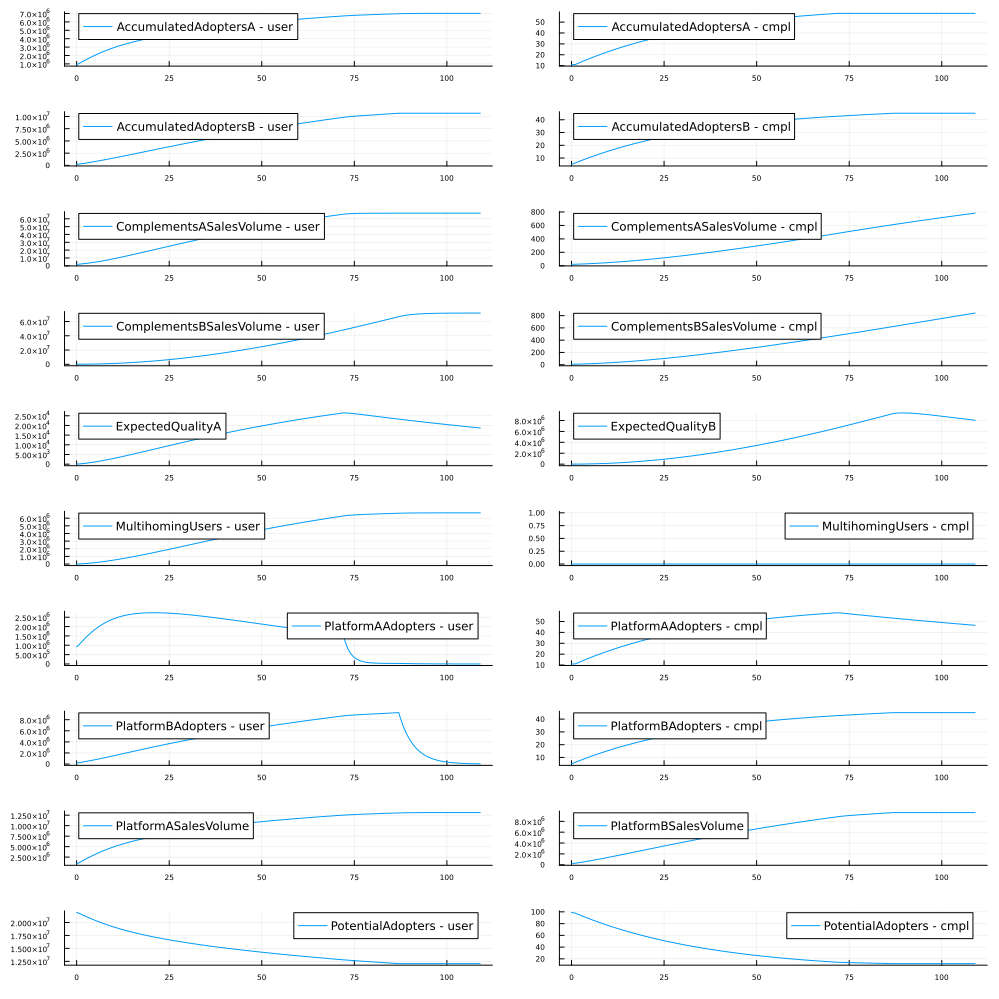

In [5]:
using Plots

default(guidefontsize=6)
default(tickfontsize=5)
# Create the plot
p = Array{Any}(undef, 20)

# Generate the labels
labels = ["AccumulatedAdoptersA - user", "AccumulatedAdoptersA - cmpl",
          "AccumulatedAdoptersB - user", "AccumulatedAdoptersB - cmpl",
          "ComplementsASalesVolume - user", "ComplementsASalesVolume - cmpl",
          "ComplementsBSalesVolume - user", "ComplementsBSalesVolume - cmpl",
          "ExpectedQualityA", "ExpectedQualityB",
          "MultihomingUsers - user", "MultihomingUsers - cmpl",
          "PlatformAAdopters - user", "PlatformAAdopters - cmpl",
          "PlatformBAdopters - user", "PlatformBAdopters - cmpl",
          "PlatformASalesVolume", "PlatformBSalesVolume",
          "PotentialAdopters - user", "PotentialAdopters - cmpl"]

# Generate each subplot
# Generate each subplot
for i in 1:20
    p[i] = plot(sol.t, getindex.(sol.u, i), label=labels[i])
end

# Combine all subplots into one plot
# Specify the size argument to adjust the overall plot size
plot(p..., layout=(10,2), size=(1000, 1000))

外部ファイルからデータファイルを読み込み、数値積分値と比較できる時系列変化グラフを作成する。
データのグラフを点線、数値積分結果のグラフを実線とする。

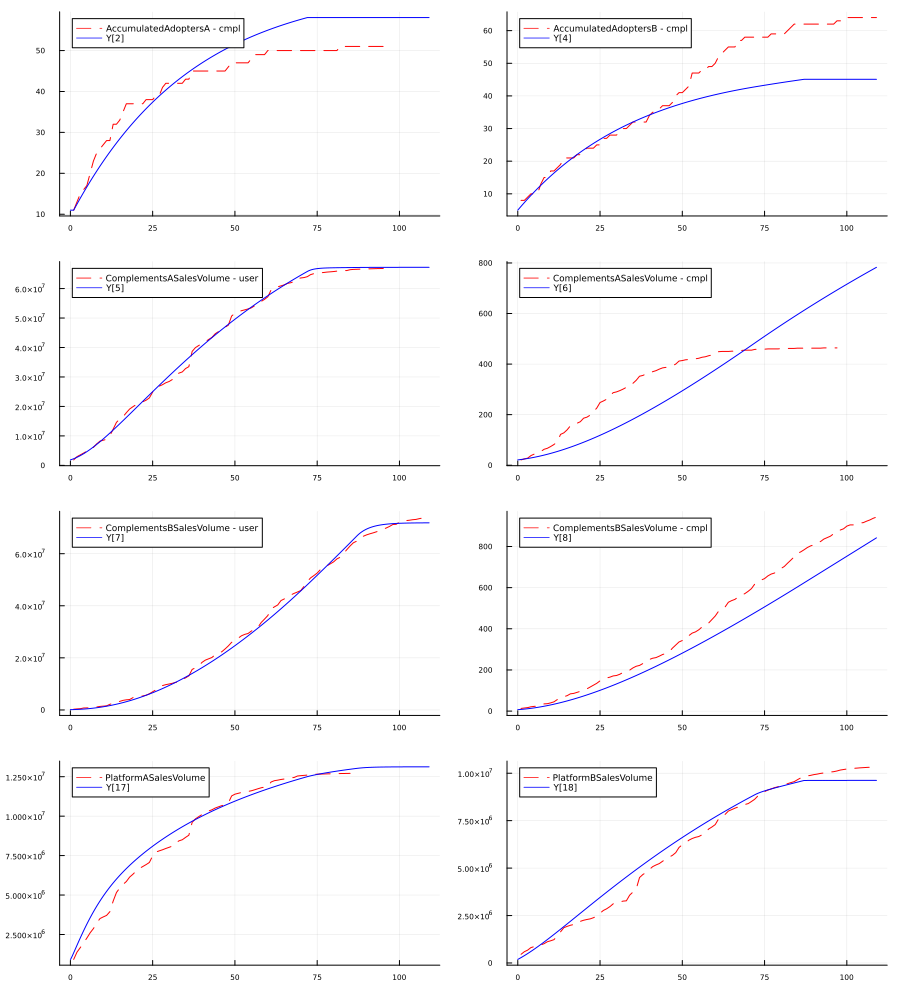

"d:\\Dropbox\\JuliaDocs\\2_Wii_PS3_Case\\WiiPS3_results.pdf"

In [6]:
using Plots
using CSV
using DataFrames 

# Function to load data
function load_data(filepath)
    data = CSV.read(filepath, DataFrame)
    return data[:,1], data[:,2]
end

# Define labels and filepaths for the plots
file_labels = [("Wiipublisher.csv", "AccumulatedAdoptersA - cmpl", "Y[2]"), 
               ("PS3publisher.csv", "AccumulatedAdoptersB - cmpl", "Y[4]"), 
               ("Wiiperformance.csv", "ComplementsASalesVolume - user", "Y[5]"), 
               ("Wiititle.csv", "ComplementsASalesVolume - cmpl", "Y[6]"), 
               ("PS3salesvolume.csv", "ComplementsBSalesVolume - user", "Y[7]"), 
               ("PS3title.csv", "ComplementsBSalesVolume - cmpl", "Y[8]"), 
               ("Wiipfm.csv", "PlatformASalesVolume", "Y[17]"), 
               ("PS3pfm.csv", "PlatformBSalesVolume", "Y[18]")]

# Define indices for Y variables
Y_indices = [2, 4, 5, 6, 7, 8, 17, 18]

# Create combined plots
p_combined = plot(layout=(4,2), size=(900,1000))

for i in 1:length(file_labels)
    filepath, data_label, sol_label = file_labels[i]
    # Load data
    t, y = load_data(filepath)
    # Plot data from external files
    plot!(p_combined[i], t, y, label=data_label, legendfontsize=6, linestyle=:dash, linecolor=:red)
    # Plot calculated results
    plot!(p_combined[i], sol.t, sol[Y_indices[i],:], label=sol_label, legendfontsize=6, linecolor=:blue)
end

# Display the combined plot
display(p_combined)

# Save the combined plot to a png file
savefig(p_combined, "WiiPS3_results.png")

# Save the combined plot to a pdf file
savefig(p_combined, "WiiPS3_results.pdf")


時系列グラフに軸ラベルを表示する

┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76
┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76
┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76


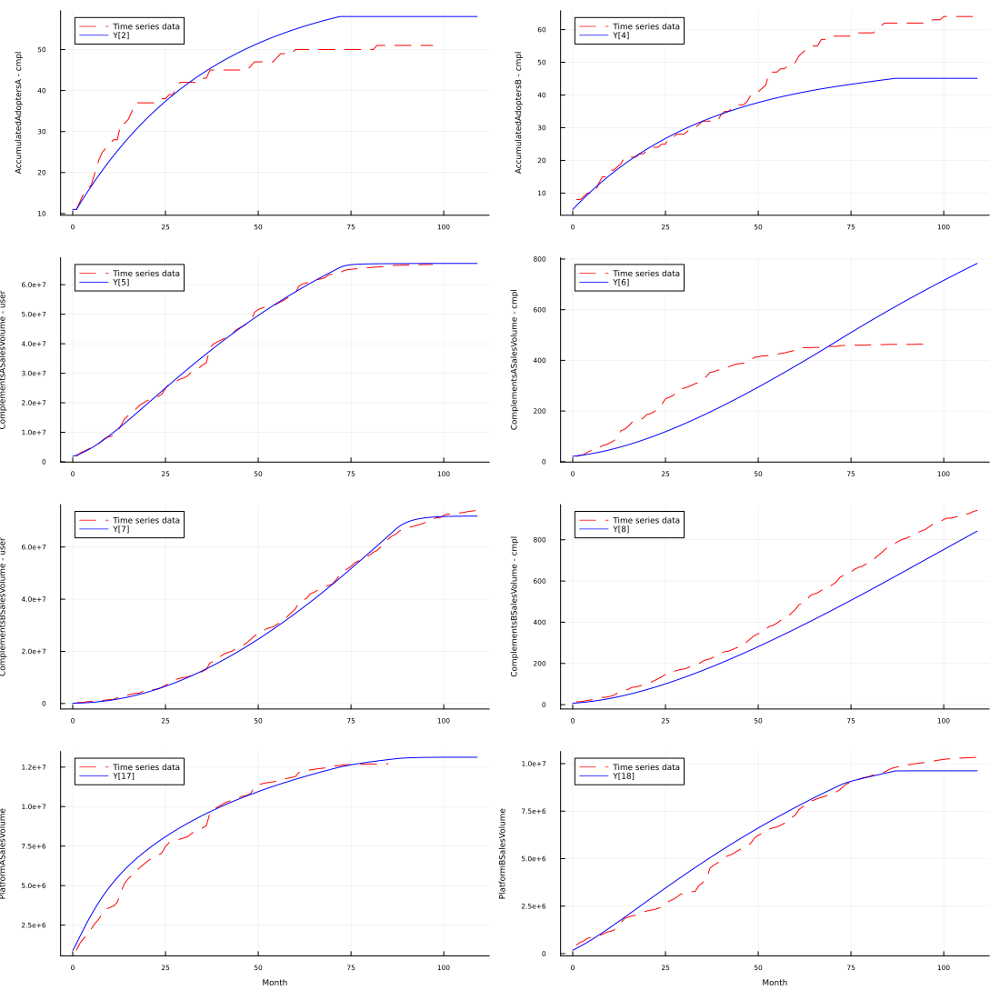

┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76
┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76
┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76
┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76


┌ Warning: Skipped yaxis arg plain
└ @ Plots C:\Users\MakotoKimura\.julia\packages\Plots\p3KMq\src\axes.jl:76


"d:\\Dropbox\\JuliaDocs\\2_Wii_PS3_Case\\WiiPS3_results.pdf"

In [8]:
using Plots
using CSV
using DataFrames
using Printf  # Import the Printf module to use @sprintf

# Function to load data
function load_data(filepath)
    data = CSV.read(filepath, DataFrame)
    return data[:,1], data[:,2]
end

# Define labels and filepaths for the plots
file_labels = [("Wiipublisher.csv", "AccumulatedAdoptersA - cmpl", "Y[2]"), 
("PS3publisher.csv", "AccumulatedAdoptersB - cmpl", "Y[4]"), 
("Wiiperformance.csv", "ComplementsASalesVolume - user", "Y[5]"), 
("Wiititle.csv", "ComplementsASalesVolume - cmpl", "Y[6]"), 
("PS3salesvolume.csv", "ComplementsBSalesVolume - user", "Y[7]"), 
("PS3title.csv", "ComplementsBSalesVolume - cmpl", "Y[8]"), 
("Wiipfm.csv", "PlatformASalesVolume", "Y[17]"), 
("PS3pfm.csv", "PlatformBSalesVolume", "Y[18]")]

# Define indices for Y variables
Y_indices = [2, 4, 5, 6, 7, 8, 17, 18]

# Create combined plots
p_combined = plot(layout=(4,2), size=(1100,1100))  # Increase the overall plot size

for i in 1:length(file_labels)
    filepath, data_label, sol_label = file_labels[i]
    # Load data
    t, y = load_data(filepath)
    # Plot data from external files
    plot!(p_combined[i], t, y, label="Time series data", legendfontsize=6, linestyle=:dash, linecolor=:red)
    # Plot calculated results
    plot!(p_combined[i], sol.t, sol[Y_indices[i],:], label=sol_label, legendfontsize=6, linecolor=:blue)
    # Set y-label for each subplot
    ylabel!(p_combined[i], data_label, fontsize=8)  # Decrease the font size
    # Set y-axis format
    yaxis!(p_combined[i], :plain, yformatter = y -> abs(y) >= 1e6 ? replace(@sprintf("%.1e", y), r"e([+-])0(\d)" => s"e\1\2") : @sprintf("%d", y))  # Change format based on the value
    
    # Set x-label for bottom subplots
    if i in [7, 8]
        xlabel!(p_combined[i], "Month", fontsize=8)  # Decrease the font size
    end
end

# Display the combined plot
display(p_combined)

# Save the combined plot to a png file
savefig(p_combined, "WiiPS3_results.png")

# Save the combined plot to a pdf file
savefig(p_combined, "WiiPS3_results.pdf")

各データセットに対して決定係数(R^2)、Theilの不等式統計（Um, Us, Uc）、平均絶対誤差（MAE）、平均二乗誤差（MSE）、そして平均絶対パーセント誤差（MAPE）を計算し、結果をDataFrameに保存する。その後、DataFrameの内容を出力する。ここで、各行は特定のデータセットに対応し、各列は誤差指標に対応する。

In [6]:
using Statistics
using DataFrames
using Interpolations

# Function to load data
function load_data(filepath)
    data = CSV.read(filepath, DataFrame)
    return data[:,1], data[:,2]
end

# Define labels and filepaths for the plots
# Define labels and filepaths for the plots
file_labels = [("Wiipublisher.csv", "AccumulatedAdoptersA - cmpl", "Y[2]"), 
               ("PS3publisher.csv", "AccumulatedAdoptersB - cmpl", "Y[4]"), 
               ("Wiiperformance.csv", "ComplementsASalesVolume - user", "Y[5]"), 
               ("Wiititle.csv", "ComplementsASalesVolume - cmpl", "Y[6]"), 
               ("PS3salesvolume.csv", "ComplementsBSalesVolume - user", "Y[7]"), 
               ("PS3title.csv", "ComplementsBSalesVolume - cmpl", "Y[8]"), 
               ("Wiipfm.csv", "PlatformASalesVolume", "Y[17]"), 
               ("PS3pfm.csv", "PlatformBSalesVolume", "Y[18]")]

# Define indices for Y variables
Y_indices = [2, 4, 5, 6, 7, 8, 17, 18]

# Define DataFrame for storing error metrics
error_metrics_df = DataFrame(
    DataLabel = String[], 
    NumberOfDataPoints = Int64[], # Add field for number of data points
    R2 = Float64[],  # R^2 (Coefficient of determination)
    Um = Float64[],  # Theil's inequality statistics
    Us = Float64[],
    Uc = Float64[],
    MAE = Float64[], 
    MSE = Float64[], 
    MAPE = Float64[]
)

for i in 1:length(file_labels)
    filepath, data_label, sol_label = file_labels[i]
    # Load data
    t, y = load_data(filepath)
    # Record the number of data points
    num_data_points = length(t)
    # Get the range of time values for which data exists
    t_min, t_max = minimum(t), maximum(t)
    # Filter sol's time points to the range of time values for which data exists
    sol_indices = (sol.t .>= t_min) .& (sol.t .<= t_max)
    sol_t, sol_y = sol.t[sol_indices], sol[Y_indices[i],sol_indices]
    # Interpolate the numerical solution to match the time steps of the loaded data
    interp_func = LinearInterpolation(sol_t, sol_y, extrapolation_bc=Line())
    sol_y_interp = interp_func.(t)
    # Compute the errors
    errors = abs.(y - sol_y_interp)
    # Compute MAE, MSE, and MAPE
    mae = mean(errors)
    mse = mean(errors.^2)
    mape = mean(errors ./ abs.(y)) * 100
    # Compute R-squared (coefficient of determination)
    ss_total = sum((y .- mean(y)).^2)
    ss_res = sum((y .- sol_y_interp).^2)
    r2 = 1 - ss_res/ss_total
    # Compute Theil's inequality statistics
    y_mean = mean(y)
    sol_y_interp_mean = mean(sol_y_interp)
    um = sqrt(sum((y - sol_y_interp).^2)) / (sqrt(sum((y.^2)) + sqrt(sum((sol_y_interp).^2))))
    us = sqrt(sum(((y .- y_mean) .- (sol_y_interp .- sol_y_interp_mean)).^2)) / sqrt(sum((y .- y_mean).^2))
    uc = sqrt(sum(((y .- y_mean) .+ (sol_y_interp .- sol_y_interp_mean)).^2)) / sqrt(sum((y .+ sol_y_interp).^2))
    
    # Check if um + us + uc is close to 1, if not adjust the values
    total = um + us + uc
    if abs(total - 1) > 1e-6
        um /= total
        us /= total
        uc /= total
    end
    
    # Append the computed error metrics to the DataFrame
    push!(error_metrics_df, (data_label, num_data_points, r2, um, us, uc, mae, mse, mape))
end

# Print the DataFrame containing R^2, Theil's inequality statistics, MAE, MSE, and MAPE values
println(error_metrics_df)
#
CSV.write("WiiPS3_errmetrics.csv", error_metrics_df)

8×9 DataFrame
 Row │ DataLabel                       NumberOfDataPoints  R2        Um         Us         Uc        MAE             MSE             MAPE     
     │ String                          Int64               Float64   Float64    Float64    Float64   Float64         Float64         Float64  
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ AccumulatedAdoptersA - cmpl                     97  0.711856  0.14691    0.542494   0.310596       4.67828       28.2737      10.5511
   2 │ AccumulatedAdoptersB - cmpl                    109  0.602266  0.23607    0.427657   0.336273       8.50311      127.941       15.7093
   3 │ ComplementsASalesVolume - user                  97  0.997322  0.0443466  0.0967517  0.858902       8.89266e5      1.25025e12   3.14902
   4 │ ComplementsASalesVolume - cmpl                  97  0.39846   0.199716   0.49444    0.305844      96.2748     12479.6         

"WiiPS3_errmetrics.csv"

マルチホーミング率の時系列変化グラフを出力する

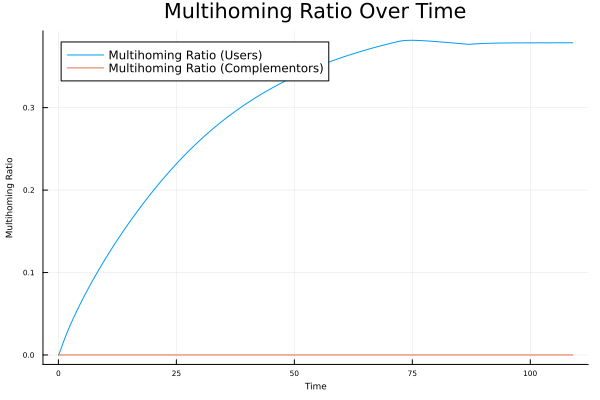

In [8]:
using Plots
# zidz function 
function zidz(a, b)
      if abs(b) < 1e-6
          return 0.0
      else
          return a / b
      end
  end
  
# Extract times and MultihomingRatio for users and complementors
times = sol.t
multihoming_ratios_user = [zidz(sol.u[i][11], (sol.u[i][1] + sol.u[i][3])) for i in 1:length(sol.u)]
multihoming_ratios_cmpl = [zidz(sol.u[i][12], (sol.u[i][2] + sol.u[i][4])) for i in 1:length(sol.u)]

# Create the plot
plot(times, multihoming_ratios_user, label="Multihoming Ratio (Users)")
plot!(times, multihoming_ratios_cmpl, label="Multihoming Ratio (Complementors)")

xlabel!("Time")
ylabel!("Multihoming Ratio")
title!("Multihoming Ratio Over Time")

マルチホーミング率の時系列変化グラフを外部ファイルに出力する

In [9]:
using Plots
# zidz function 
function zidz(a, b)
      if abs(b) < 1e-6
          return 0.0
      else
          return a / b
      end
  end
  
# Extract times and MultihomingRatio for users and complementors
times = sol.t
multihoming_ratios_user = [zidz(sol.u[i][11], (sol.u[i][1] + sol.u[i][3])) for i in 1:length(sol.u)]
multihoming_ratios_cmpl = [zidz(sol.u[i][12], (sol.u[i][2] + sol.u[i][4])) for i in 1:length(sol.u)]

# Create the plot
pp=plot(times, multihoming_ratios_user, label="Multihoming Ratio (Users)")
plot!(times, multihoming_ratios_cmpl, label="Multihoming Ratio (Complementors)")

xlabel!("Time")
ylabel!("Multihoming Ratio")
title!("Multihoming Ratio Over Time")
#
# Save the plot to a PNG file
savefig(pp, "WiiPS3compMHGratio_plot.png")

# Save the plot to a PDF file
savefig(pp, "WiiPS3compMHGratio_plot.pdf")

"d:\\Dropbox\\JuliaDocs\\DigitalPlatformsDynamics\\WiiPS3compMHGratio_plot.pdf"

マルチホーミング率の最終値をグラフにも表示して、外部ファイルに保存する．

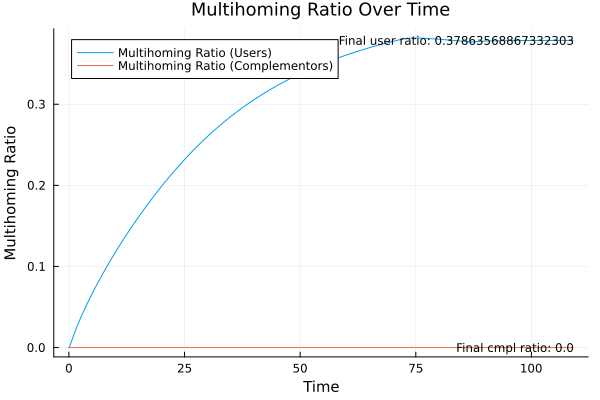

"d:\\Dropbox\\JuliaDocs\\DigitalPlatformsDynamics\\WiiPS3compMHGratio_plot.pdf"

In [19]:
using Plots
using CSV
using DataFrames

# Use the GR backend for Plots
gr()

# zidz function 
function zidz(a, b)
      if abs(b) < 1e-6
          return 0.0
      else
          return a / b
      end
end
  
# Extract times and MultihomingRatio for users and complementors
times = sol.t
multihoming_ratios_user = [zidz(sol.u[i][11], (sol.u[i][1] + sol.u[i][3])) for i in 1:length(sol.u)]
multihoming_ratios_cmpl = [zidz(sol.u[i][12], (sol.u[i][2] + sol.u[i][4])) for i in 1:length(sol.u)]

# Save final multihoming ratios
final_multihoming_ratio_user = multihoming_ratios_user[end]
final_multihoming_ratio_cmpl = multihoming_ratios_cmpl[end]

# Create the plot
p = plot(times, multihoming_ratios_user, label="Multihoming Ratio (Users)", legendfontsize=8, tickfontsize=8)
plot!(p, times, multihoming_ratios_cmpl, label="Multihoming Ratio (Complementors)")

# Display final multihoming ratios on the graph
annotate!(p, times[end], final_multihoming_ratio_user, text("Final user ratio: $final_multihoming_ratio_user", 8, :right))
annotate!(p, times[end], final_multihoming_ratio_cmpl, text("Final cmpl ratio: $final_multihoming_ratio_cmpl", 8, :right))

xlabel!(p, "Time", guidefontsize=10)
ylabel!(p, "Multihoming Ratio", guidefontsize=10)
title!(p, "Multihoming Ratio Over Time", titlefontsize=12)

# Show the plot
display(p)

# Save the data to a CSV file
df = DataFrame(Time = times, MultihomingRatioUser = multihoming_ratios_user, MultihomingRatioCmpl = multihoming_ratios_cmpl)
CSV.write("WiiPS3_MHGratio.csv", df)

# Save the plot to a PNG file
savefig(p, "WiiPS3compMHGratio_plot.png")

# Save the plot to a PDF file
savefig(p, "WiiPS3compMHGratio_plot.pdf")

